In [1]:
# Import libraries
using DataFrames
using LinearAlgebra
using Statistics
using XLSX
using Plots
using Random
using Measures

In [2]:
# Download and extract the dataset
dataset_file = "DryBeanDataset/Dry_Bean_Dataset.xlsx"

if !isfile(dataset_file)
    run(`wget https://archive.ics.uci.edu/ml/machine-learning-databases/00602/DryBeanDataset.zip`)
    run(`unzip DryBeanDataset.zip`)
    run(`rm DryBeanDataset.zip`)
end

In [3]:
# Import the dataset
sheet = "Dry_Beans_Dataset"
df = DataFrame(XLSX.readtable(dataset_file, sheet))
df[1:5,:]

Row,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any
1,28395,610.291,208.178,173.889,1.19719,0.549812,28715,190.141,0.763923,0.988856,0.958027,0.913358,0.00733151,0.00314729,0.834222,0.998724,SEKER
2,28734,638.018,200.525,182.734,1.09736,0.411785,29172,191.273,0.783968,0.984986,0.887034,0.953861,0.00697866,0.00356362,0.909851,0.99843,SEKER
3,29380,624.11,212.826,175.931,1.20971,0.562727,29690,193.411,0.778113,0.989559,0.947849,0.908774,0.00724391,0.00304773,0.825871,0.999066,SEKER
4,30008,645.884,210.558,182.517,1.15364,0.498616,30724,195.467,0.782681,0.976696,0.903936,0.928329,0.00701673,0.00321456,0.861794,0.994199,SEKER
5,30140,620.134,201.848,190.279,1.0608,0.33368,30417,195.897,0.773098,0.990893,0.984877,0.970516,0.00669701,0.00366497,0.9419,0.999166,SEKER


In [4]:
# Extracting data matrix
n = size(df)[1];
df = df[randperm(n), :] # The labels are ordered, I want to remove this bias (mostly for plotting)
m = Matrix(df[:,begin:end-1]);

In [5]:
# Centering and rescaling features
mean = Statistics.mean(m, dims=1)
std = Statistics.std(m, dims=1)
m_standardized = (m.-mean)./std;

In [6]:
# Computing the covariance matrix
c = (transpose(m_standardized)*m_standardized)/n

# Compute eigenvalues and eigenvectors
eig = eigen(c)
eigenvectors = reverse(eig.vectors)
eigenvalues = reverse(eig.values);

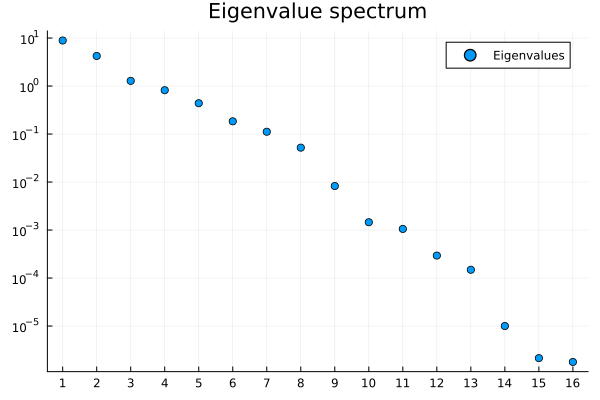

In [7]:
# Plotting the eigenvalue spectrum
plot(eigenvalues,
    seriestype=:scatter,
    label="Eigenvalues",
    xticks=1:length(eigenvalues),
    yscale=:log10,
    yticks=[10.0^i for i in ceil(log10(maximum(eigenvalues))):-1:floor(log10(minimum(eigenvalues)))],
    title = "Eigenvalue spectrum")

In [8]:
# Computing principal components of the dataset
pc = m_standardized*eigenvectors;

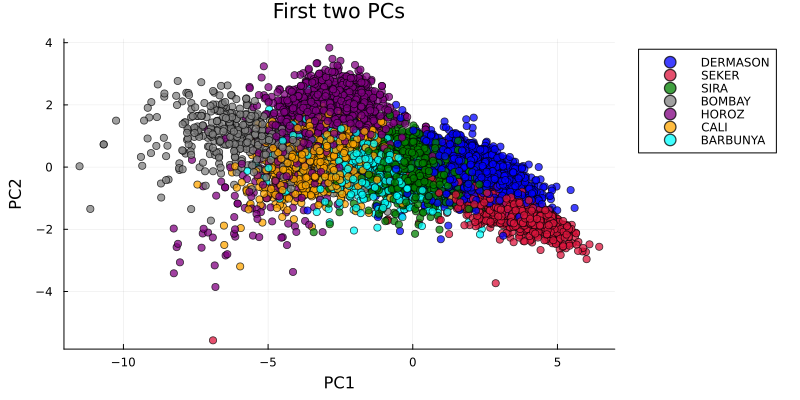

In [9]:
# Plotting first two principal components
distinguishable_colors = ("blue", "crimson", "green", "gray", "purple", "orange", "cyan")

classes = unique(df.Class)
color_dict = Dict(c => distinguishable_colors[i] for (i,c) in enumerate(classes))
colors = map(class -> color_dict[class], df.Class)

pc_plot = plot(
    pc[:, 1],
    pc[:, 2],
    color = colors,
    alpha=.75,
    xlabel="PC1",
    ylabel="PC2",
    seriestype=:scatter,
    title = "First two PCs",
    label=nothing
)


# The following is a trick done in order to show the legend
for class in classes
    indexes = (1:n)[df.Class .== class]

    plot!(
        pc[indexes[1:2], 1],
        pc[indexes[1:2], 2],
        color=color_dict[class],
        label = class,
        seriestype=:scatter,
        alpha=0.75,
        legend = :outertopright)
end

plot!(size=(800, 400), margin = 4mm)

pc_plot

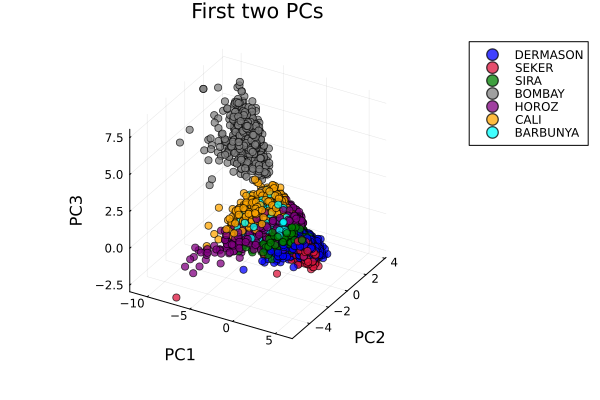

In [10]:
# Plotting first three principal components
distinguishable_colors = ("blue", "crimson", "green", "gray", "purple", "orange", "cyan")

classes = unique(df.Class)
color_dict = Dict(c => distinguishable_colors[i] for (i,c) in enumerate(classes))
colors = map(class -> color_dict[class], df.Class)

pc_plot = plot(
    pc[:, 1],
    pc[:, 2],
    pc[:, 3],
    color = colors,
    alpha=.75,
    xlabel="PC1",
    ylabel="PC2",
    zlabel="PC3",
    seriestype=:scatter,
    title = "First two PCs",
    label=nothing
)


# The following is a trick done in order to show the legend
for class in classes
    indexes = (1:n)[df.Class .== class]

    plot!(
        pc[indexes[1:2], 1],
        pc[indexes[1:2], 2],
        pc[indexes[1:2], 3],
        color=color_dict[class],
        label = class,
        seriestype=:scatter,
        alpha=0.75,
        legend = :outertopright)
end

pc_plot

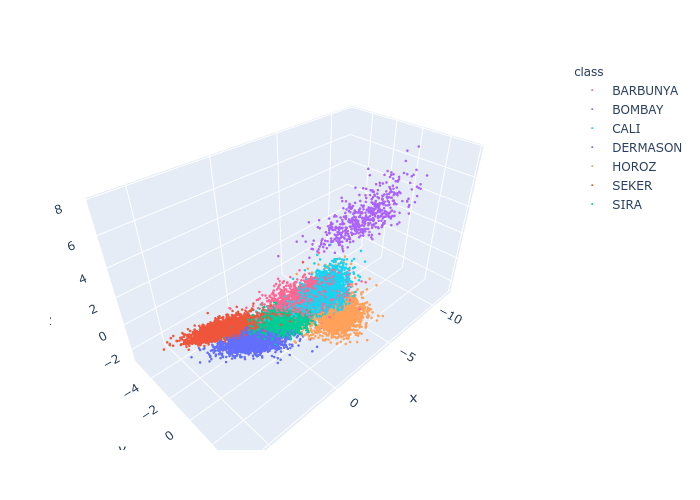

In [11]:
# Saving an interactive 3d plot of the first three PCs 

import PlotlyJS

plot_df = DataFrame(PC1=pc[:, 1], PC2=pc[:, 2], PC3=pc[:, 3], class=df.Class, color=colors)

pca_plot = PlotlyJS.plot(
    plot_df,
    x = :PC1,
    y = :PC2,
    z = :PC3,
    type = "scatter3d",
    labels=Dict(
        :PC1 => "PC1",
        :PC2 => "PC2",
        :PC3 => "PC3"
    ),
    color = :class,
    mode="markers",
    marker_size=1.5
)

open("./dry_beans_3d_pcs_plot.html", "w") do io
    PlotlyJS.PlotlyBase.to_html(io, pca_plot.plot)
end

pca_plot